In [1]:
%reload_ext autoreload
%autoreload 2

import logging
logger = logging.getLogger()
logger.setLevel(logging.INFO)

import scipy.stats as stats
import matplotlib.pyplot as plt
import matplotlib as mpl

from dbspace.utils.structures import nestdict
import seaborn as sns
sns.set_theme('paper')
sns.set_style("white")
import numpy as np
import pickle
from matplotlib.patches import Rectangle, Circle
from numpy import ndenumerate
from dbspace.readout.OBands import OBands


Importing from DBSpace.readout...


# Traditional (NHST) Analysis of Oscillatory Features
## Date: 3/25/2024



In [ ]:
frame_to_analyse = 'Chronic_Frame_Dec2022'
do_weeks = ["C01","C24"]
correct_for_mismatch_compression = False

BRFrame = pickle.load(open("/home/virati/Data/phd_vrt_2013/neural/lfp/Data_frame_Chronics.npy","rb"))
BRFrame.check_meta()


FileNotFoundError: [Errno 2] No such file or directory: '/tmp/Chronic_Frame_Dec2022.pickle'

In [ ]:
#Move forward with traditional oscillatory band analysis
analysis = OBands(BRFrame, ['901','903','905','906','907','908'])
analysis.feat_extract(do_corrections=correct_for_mismatch_compression)

Delta with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (1, 4)}
Alpha with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (8, 13)}
Theta with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (4, 8)}
Beta* with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (13, 20)}
Beta with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (13, 30)}
Gamma1 with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (35, 60)}
Gamma2 with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (60, 100)}
Gamma with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (30, 100)}
Stim with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (129, 131)}
SHarm with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (30, 34)}
THarm with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (64, 68)}
Clock with {'fn': <function get_pow at 0x737d537b61f0>, 'param': (104.5, 106.5)}
fSlope with {'fn': <function get_slope at 0x737d537b6280>, 'param': {'frange': (1, 20), 'linord

In [ ]:
# Do comparison of two timepoints here
#analysis.scatter_state(week='all',pt=['908'],feat='SHarm')
#analysis.scatter_state(week='all',pt=['908'],feat='Stim')
ks_stats = nestdict()
pts = ['901','903','905','906','907','908']
bands = ['Delta','Theta','Alpha','Beta*','Gamma1']
all_feats = ['L-' + band for band in bands] + ['R-' + band for band in bands]

circ = 'day'
week_distr = nestdict()
for pt in pts:
    for ff in bands:
        print('Computing ' + ' ' + ff)
        _,ks_stats[pt][ff],week_distr[pt][ff] =analysis.scatter_state(weeks=do_weeks,pt=pt,feat=ff,circ=circ,plot=False,plot_type='scatter',stat='ks')
        #plt.title('Plotting feature ' + ff)
    #analysis.scatter_state(week=['C01','C23'],pt='all',feat='Alpha',circ='night',plot_type='boxplot')

# Make our big stats 2d grid for all features across all patients
K_stats = np.array([[[ks_stats[pt][band][side][0] for side in ['Left','Right']] for band in bands] for pt in pts]).reshape(6,-1,order='F')
P_val = np.array([[[ks_stats[pt][band][side][1] for side in ['Left','Right']] for band in bands] for pt in pts]).reshape(6,-1,order='F')

pre_feat_vals = []
post_feat_vals = []
for pt in pts:
    for band in bands:
        for side in ['Left','Right']:
            pre_feat_vals.append(week_distr[pt][band][side][do_weeks[0]])
            post_feat_vals.append(week_distr[pt][band][side][do_weeks[1]])

#pre_feat_vals = np.array(pre_feat_vals, dtype=object).reshape(6,-1,order='F')
#post_feat_vals = np.array(post_feat_vals, dtype=object).reshape(6,-1,order='F')

Computing  Delta
Computing  Theta
Computing  Alpha
Computing  Beta*
Computing  Gamma1
Computing  Delta
Computing  Theta
Computing  Alpha
Computing  Beta*
Computing  Gamma1
Computing  Delta
Computing  Theta
Computing  Alpha
Computing  Beta*
Computing  Gamma1
Computing  Delta
Computing  Theta
Computing  Alpha
Computing  Beta*
Computing  Gamma1
Computing  Delta
Computing  Theta
Computing  Alpha
Computing  Beta*
Computing  Gamma1
Computing  Delta
Computing  Theta
Computing  Alpha
Computing  Beta*
Computing  Gamma1


In [ ]:
pre_feat_vals = np.array([[[week_distr[pt][band][side][do_weeks[0]] for side in ['Left','Right']] for band in bands] for pt in pts],dtype=object).reshape(6,-1,order='F')
post_feat_vals = np.array([[[week_distr[pt][band][side][do_weeks[1]] for side in ['Left','Right']] for band in bands] for pt in pts],dtype=object).reshape(6,-1,order='F')


In [ ]:
    
def get_distr_change(patient,band,plot=True):
    
    pp = pts.index(patient)
    ff = all_feats.index(band)
    if plot:
        plt.figure()
        sns.violinplot(y=pre_feat_vals[pp,ff])
        sns.violinplot(y=post_feat_vals[pp,ff],color='red',alpha=0.3)

    return (np.mean(post_feat_vals[pp,ff]) - np.mean(pre_feat_vals[pp,ff]))



([<matplotlib.axis.XTick at 0x737d53748940>,
 [Text(0, 0, 'L-Delta'),
  Text(1, 0, 'L-Theta'),
  Text(2, 0, 'L-Alpha'),
  Text(3, 0, 'L-Beta*'),
  Text(4, 0, 'L-Gamma1'),
  Text(5, 0, 'R-Delta'),
  Text(6, 0, 'R-Theta'),
  Text(7, 0, 'R-Alpha'),
  Text(8, 0, 'R-Beta*'),
  Text(9, 0, 'R-Gamma1')])

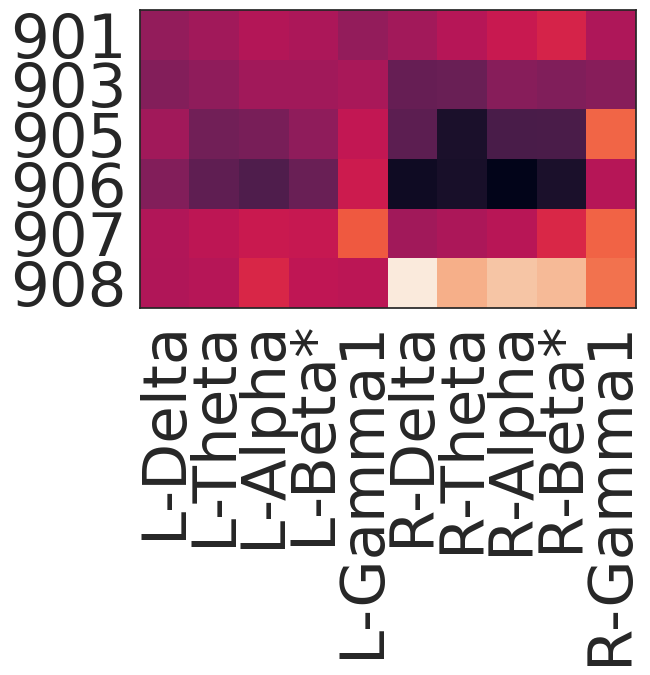

In [ ]:
change_grid = np.zeros((len(pts),len(all_feats)))
for pp,pt in enumerate(pts):
    for ff,freq in enumerate(all_feats):
        change_grid[pp,ff] = get_distr_change(pt,freq,plot=False)

plt.figure()
plt.imshow(change_grid)
plt.yticks(range(len(pts)),pts)
plt.xticks(range(len(all_feats)), all_feats, rotation=90)



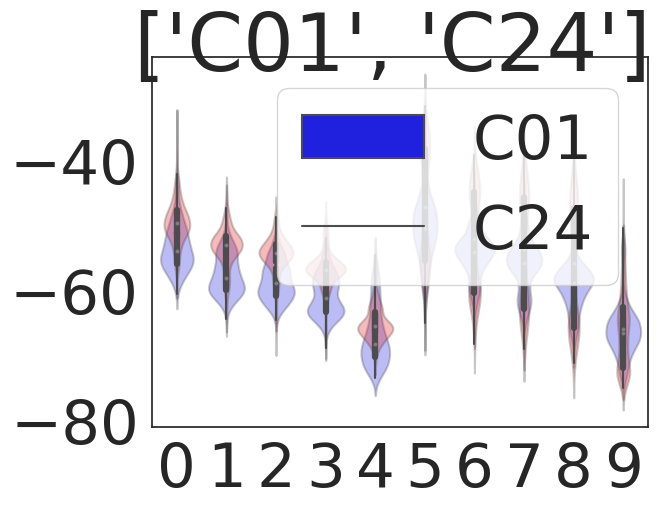

In [ ]:
def all_ensemble_change(plot=True):
    
    pre_flat_list = []
    post_flat_list = []
    
    for ff,freq in enumerate(all_feats):
        pre_flat_list.append([item for sublist in pre_feat_vals[:,ff] for item in sublist])
        post_flat_list.append([item for sublist in post_feat_vals[:,ff] for item in sublist])
        
    if plot:
        plt.figure()
        ax = sns.violinplot(data=pre_flat_list,color='blue')
        ax = sns.violinplot(data=post_flat_list,color='red',alpha=0.3)
        plt.legend(do_weeks)
        plt.suptitle(do_weeks)
        plt.setp(ax.collections,alpha=0.3)

all_ensemble_change()



In [ ]:
# want to marginalize across patients and compare all band observations in C01 with all from C24
def get_ensemble_change(band,plot=True):
    ff = all_feats.index(band)
    pre_flat_list = [item for sublist in pre_feat_vals[:,ff] for item in sublist]
    post_flat_list = [item for sublist in post_feat_vals[:,ff] for item in sublist]
    if plot:
        plt.figure()
        ax = sns.violinplot(x=pre_flat_list)
        ax = sns.violinplot(x=post_flat_list,color='red',alpha=0.3)
        plt.title(band)
        plt.xlim(-10,10)
        plt.setp(ax.collections,alpha=0.3)
    #do some stats here
    print(band)
    stat_check = stats.ks_2samp(pre_flat_list,post_flat_list)
    return {'diff':(np.mean(pre_flat_list) - np.mean(post_flat_list)),'var':(np.var(pre_flat_list) - np.var(post_flat_list)),'ks':stat_check}


def get_ensemble_dist(band,plot=True):
    ff = all_feats.index(band)
    pre_flat_list = [item for sublist in pre_feat_vals[:,ff] for item in sublist]
    post_flat_list = [item for sublist in post_feat_vals[:,ff] for item in sublist]
    
    return pre_flat_list, post_flat_list

In [ ]:
test = nestdict()

for ff,freq in enumerate(all_feats):
    test[ff] = get_ensemble_change(freq,plot=False)


L-Delta
L-Theta
L-Alpha
L-Beta*
L-Gamma1
R-Delta
R-Theta
R-Alpha
R-Beta*
R-Gamma1


Text(0.5, 1.0, 'P-Values Across Features/Bands')

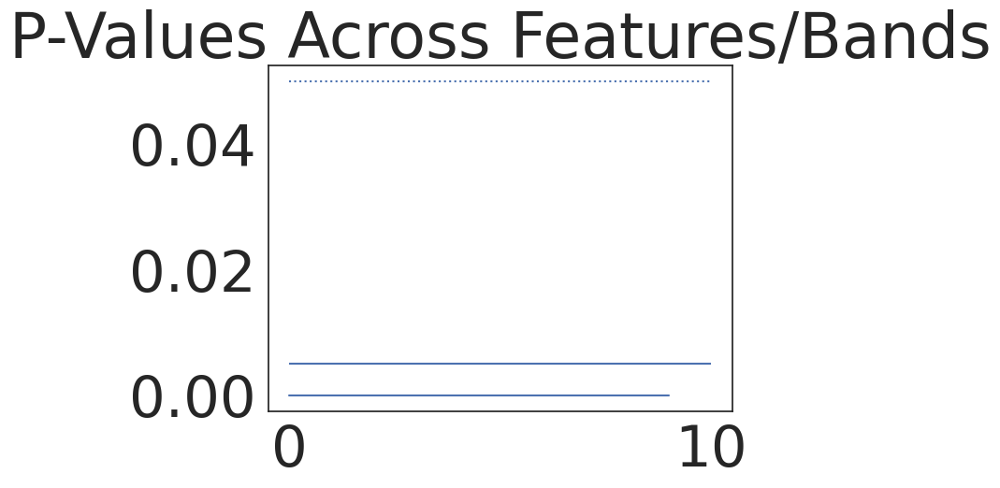

In [ ]:
list_of_p = [test[num]['ks'][1] for num,band in enumerate(all_feats)]
plt.figure()
#plt.pcolormesh(list_of_p)
plt.plot(list_of_p)
plt.hlines(0.005,0,10)
plt.hlines(0.05,0,10,linestyle='dotted')
plt.title('P-Values Across Features/Bands')
        

/tmp/ipykernel_13874/3022905111.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.pcolormesh(change_grid,cmap=plt.cm.get_cmap('viridis'))


Text(0.5, 1.0, "Band Change over Timepoints: ['C01', 'C24']")

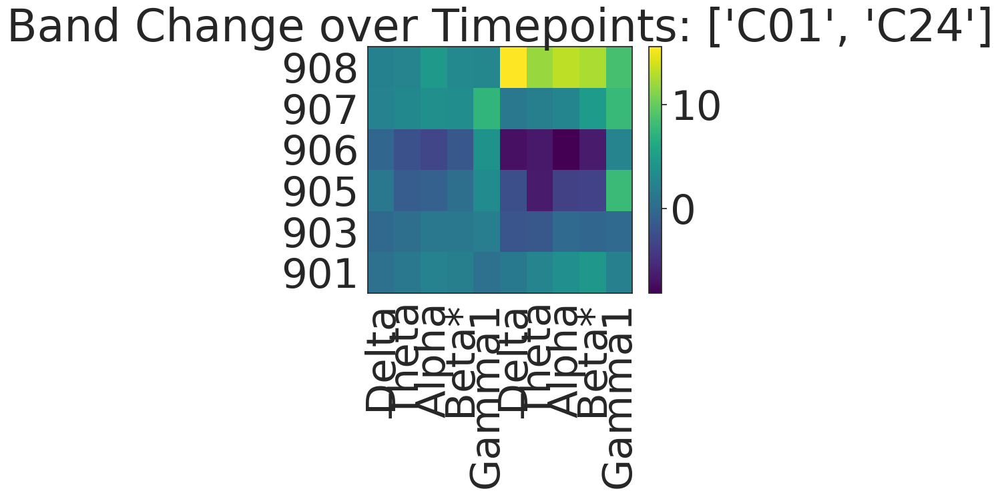

In [ ]:

''' We plot the grids here'''
plt.figure()
plt.pcolormesh(change_grid,cmap=plt.cm.get_cmap('viridis'))
plt.colorbar()
plt.xticks(np.arange(10)+0.5,bands + bands,rotation=90)
plt.yticks(np.arange(6)+0.5,pts)
plt.title('Band Change over Timepoints: ' + str(do_weeks))


/tmp/ipykernel_13874/2538899962.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.pcolormesh(change_grid,cmap=plt.cm.get_cmap('viridis'))


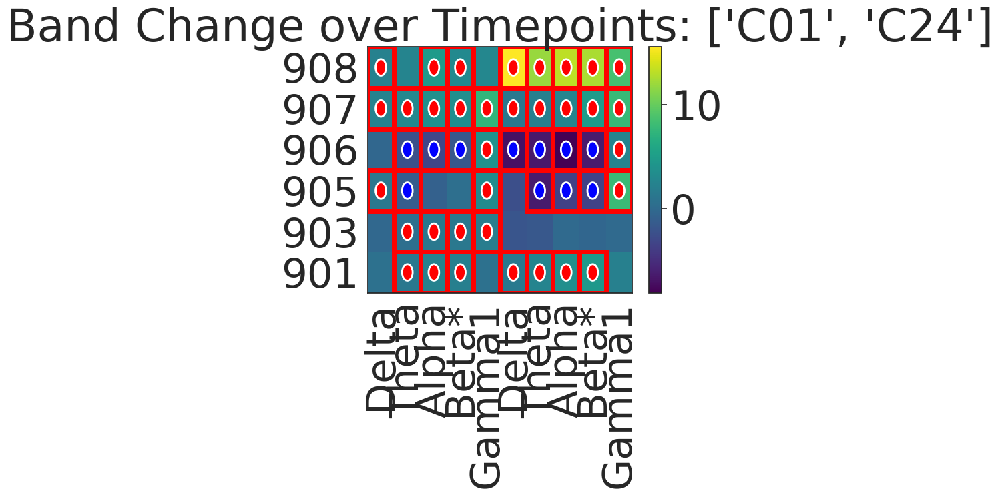

In [ ]:

ax = plt.axes()
viridis_colormap = mpl.colormaps['viridis']
plt.pcolormesh(change_grid,cmap=plt.cm.get_cmap('viridis'))
plt.colorbar()
plt.xticks(np.arange(10)+0.5,bands + bands,rotation=90)
plt.yticks(np.arange(6)+0.5,pts)
plt.title('Band Change over Timepoints: ' + str(do_weeks))

for index,value in ndenumerate(P_val):
    if value < (0.05/10):
        if change_grid[index] > 0:
            usecolor='red'
        else:
            usecolor='blue'
            
        ax.add_patch(Rectangle((index[1], index[0]), 1, 1, fill=False, edgecolor='red', lw=5))
        ax.add_patch(Circle((index[1]+0.5, index[0]+0.5), 0.2, fill=True, facecolor=usecolor, edgecolor='white', lw=2))

plt.show()


Text(0.5, 1.0, 'Significant P-value')

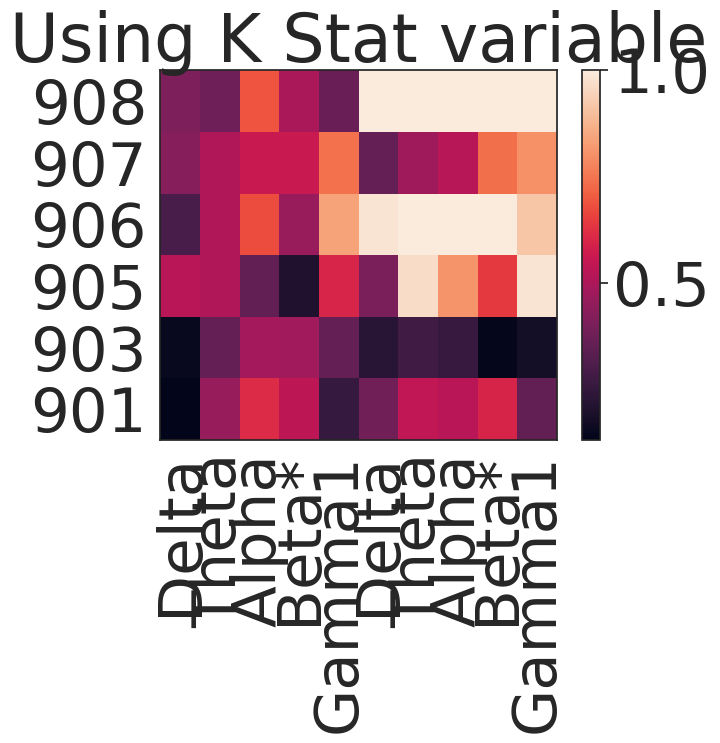

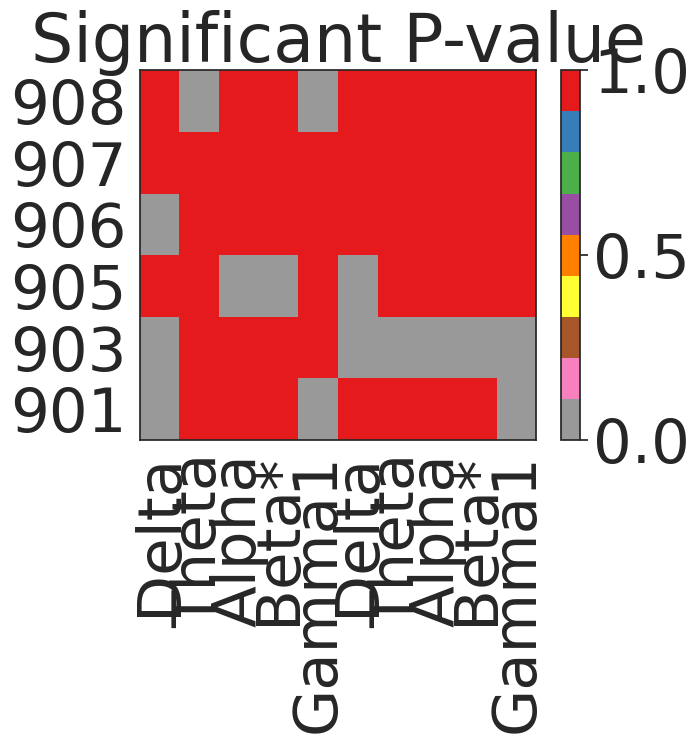

In [ ]:


plt.figure()
#plt.subplot(2,1,1)
plt.pcolormesh(K_stats);plt.colorbar()
plt.xticks(np.arange(10)+0.5,bands + bands,rotation=90)
plt.yticks(np.arange(6)+0.5,pts)
plt.title('Using K Stat variable')

plt.figure()
#plt.subplot(2,1,2)
#plt.pcolormesh((P_val < (0.05)).astype(np.int));plt.colorbar()
#P_val[P_val > (0.05/10)] = 1
plt.pcolormesh((P_val < (0.05/10)).astype(np.float32),cmap=plt.get_cmap('Set1_r'));plt.colorbar();
plt.yticks(np.arange(6)+0.5,pts)
plt.xticks(np.arange(10)+0.5,bands + bands,rotation=90)
plt.title('Significant P-value')

In [ ]:
P_val_num = (P_val<(0.05/10)).astype(int)
sig_feats = P_val_num.sum(axis=0) >= 5
sig_feats_name = (d for d,s in zip(bands,sig_feats))
#print(np.array(bands)[sig_feats.astype(np.int)])
    
for ii in plt.get_fignums():
    plt.figure(ii)
    
    plt.savefig('/tmp/' + str(ii) + circ + '.svg')

In [ ]:
# last successful run
from datetime import date
today = date.today()
print(f"Last Successful Run: {today}")

Last Successful Run: 2024-03-25
